In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Клонируем репозиторий с yolo

In [3]:
!git clone https://github.com/ultralytics/yolov5  

Cloning into 'yolov5'...
remote: Enumerating objects: 15093, done.
remote: Counting objects: 100% (132/132), done.
remote: Compressing objects: 100% (72/72), done.
remote: Total 15093 (delta 84), reused 94 (delta 60), pack-reused 14961
Receiving objects: 100% (15093/15093), 13.73 MiB | 28.12 MiB/s, done.
Resolving deltas: 100% (10423/10423), done.


### Скачиваем датасет с Roboflow

In [4]:
!pip install roboflow

%cd yolov5

from roboflow import Roboflow
rf = Roboflow(api_key="oa8agbj4cGuh3zte6w4F")
project = rf.workspace("roboflow-workspace-znzul").project("logo-detection-pquwo")
dataset = project.version(5).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 41 kB 353 kB/s 
     |████████████████████████████████| 178 kB 11.5 MB/s 
     |████████████████████████████████| 67 kB 7.8 MB/s 
     |████████████████████████████████| 54 kB 3.3 MB/s 
     |████████████████████████████████| 145 kB 70.8 MB/s 
     |████████████████████████████████| 138 kB 78.0 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=4854eca0c139dcc3c6ffeb4a9a2a78f3232ca5151a53311b807a5c5a25ab2b1b
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3
  Attempting uninstall: certifi
    Found existing installation: certi

/content/yolov5
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Logo-Detection-5 in yolov5pytorch:: 100%|██████████| 2594/2594 [00:00<00:00, 2697.21it/s]


In [5]:
!pip install -qr requirements.txt  # install dependencies

     |████████████████████████████████| 1.6 MB 5.0 MB/s 


In [7]:
%cat {dataset.location}/data.yaml

names:
- logo
nc: 1
roboflow:
  license: CC BY 4.0
  project: logo-detection-pquwo
  url: https://universe.roboflow.com/roboflow-workspace-znzul/logo-detection-pquwo/dataset/5
  version: 5
  workspace: roboflow-workspace-znzul
test: ../test/images
train: Logo-Detection-5/train/images
val: Logo-Detection-5/valid/images


In [6]:
import torch

print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.12.1+cu113 CPU


### Записываем конфигурационный файл для yolo

In [7]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [8]:
%%writetemplate /content/yolov5/models/yolov5s_logo_detection.yaml

# Parameters
nc: 1  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]


### Обучение модели

In [9]:
SIZE = 640

In [11]:
%cd /content/yolov5/
!python train.py --img {SIZE} --batch 32 --epochs 300 --data {dataset.location}/data.yaml --cfg ./models/yolov5s_logo_detection.yaml --weights '' --name yolov5s_logo_results  --cache

/content/yolov5
train: weights=, cfg=./models/yolov5s_logo_detection.yaml, data=/content/yolov5/Logo-Detection-5/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_logo_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-247-ga9f895d Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1

### Результаты

In [13]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [14]:
from IPython.display import Image, display

GROUND TRUTH TRAINING DATA:


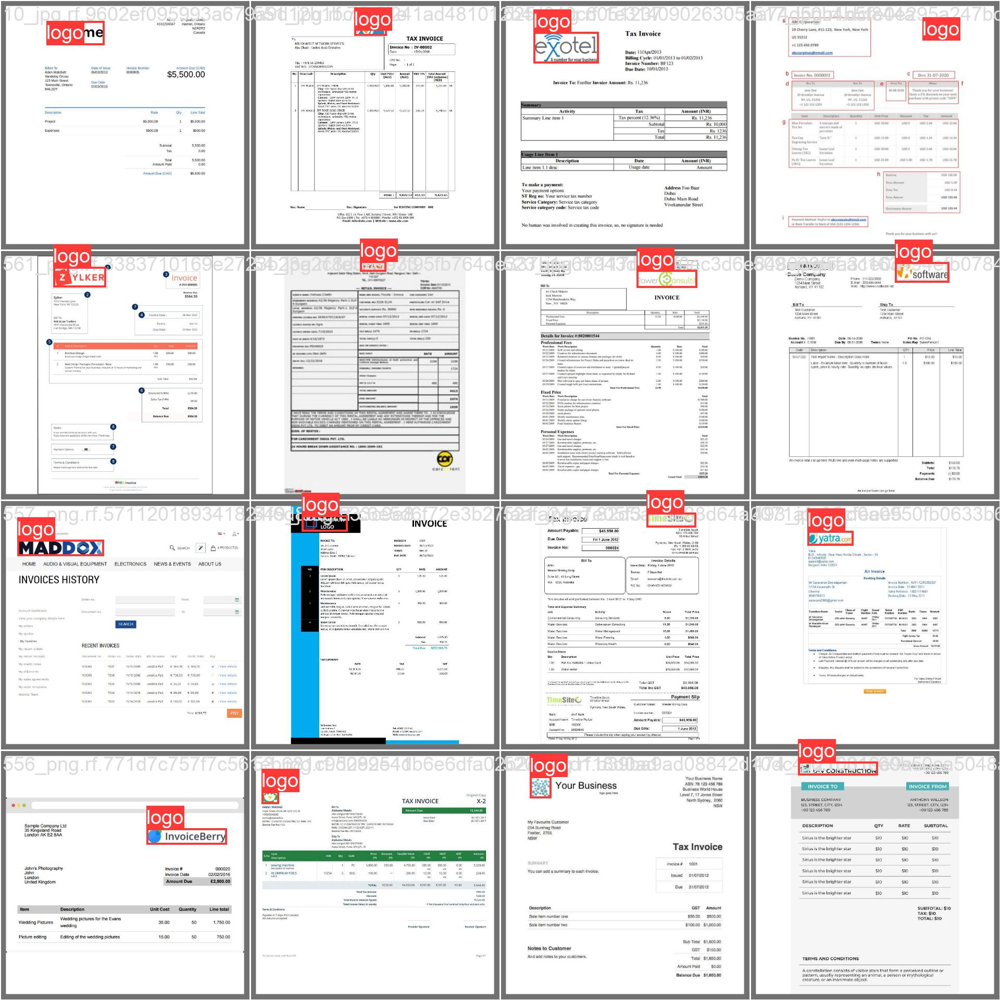

In [15]:
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_logo_results/val_batch0_labels.jpg', width=900)

### Проверяем на отложенной тестовой выборке

In [16]:
!python detect.py --weights /content/yolov5/runs/train/yolov5s_logo_results/weights/best.pt --img {SIZE} --conf 0.005 --source /content/yolov5/Logo-Detection-5/test/images --save-txt --save-conf --max-det 1 --save-crop

detect: weights=['/content/yolov5/runs/train/yolov5s_logo_results/weights/best.pt'], source=/content/yolov5/Logo-Detection-5/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.005, iou_thres=0.45, max_det=1, device=, view_img=False, save_txt=True, save_conf=True, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-247-ga9f895d Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s_logo_detection summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/54 /content/yolov5/Logo-Detection-5/test/images/137_jpg.rf.66aebfee91e0a0542f77e189482abf70.jpg: 640x640 1 logo, 12.6ms
image 2/54 /content/yolov5/Logo-Detection-5/test/images/18_jpg.rf.98e3f46e2d3ec0ead0ed5854997cbb61.jpg: 640x640 1 logo, 12.7ms
image 3/54 /content/y

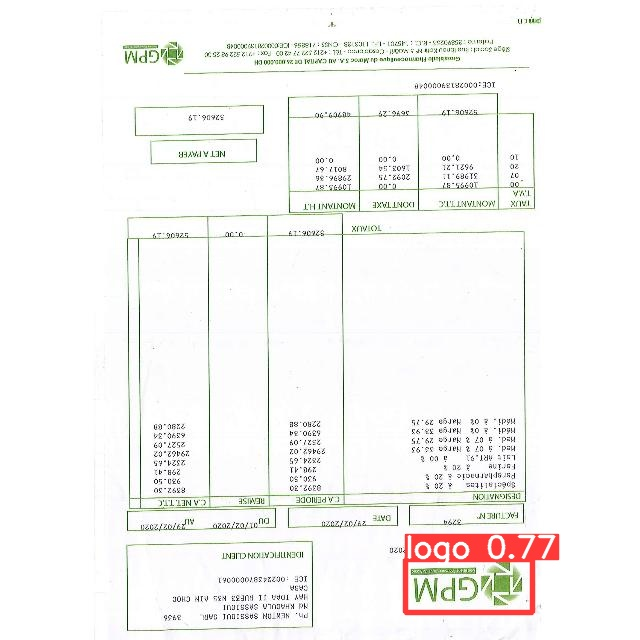

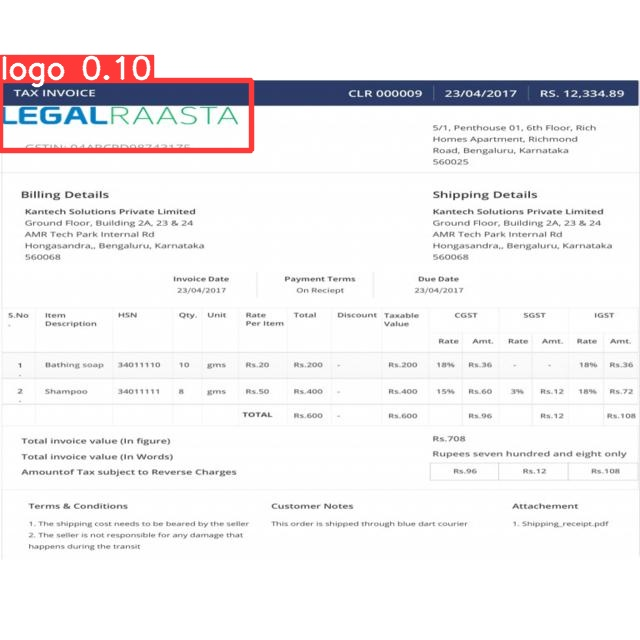

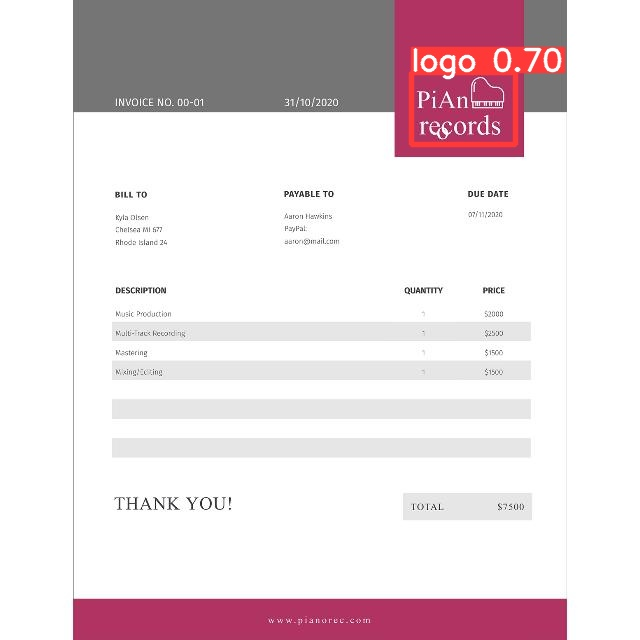

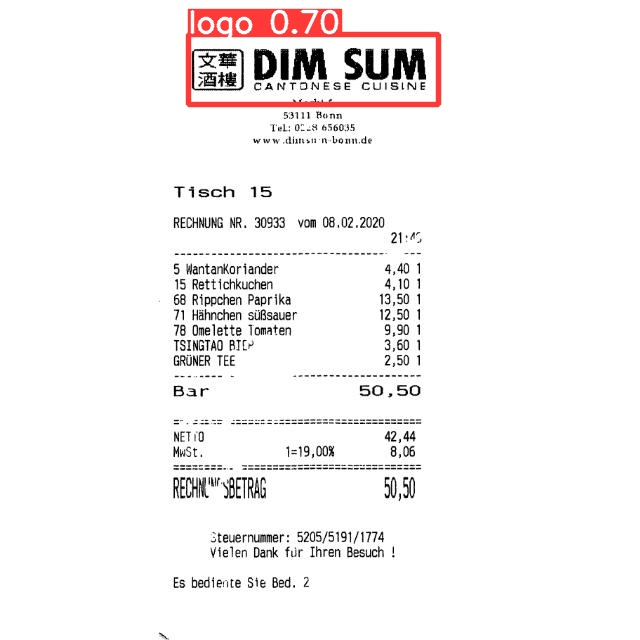

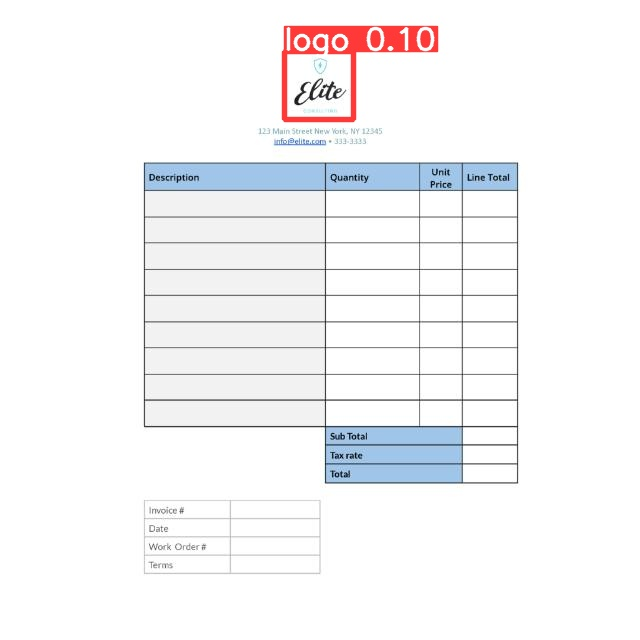

...

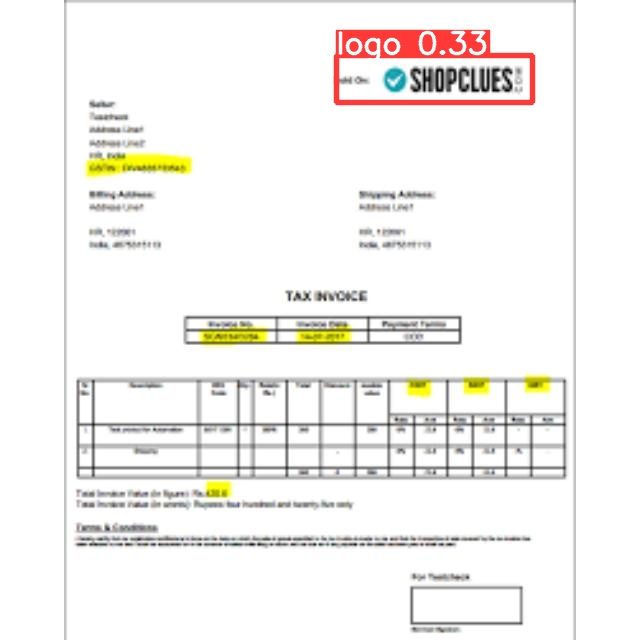

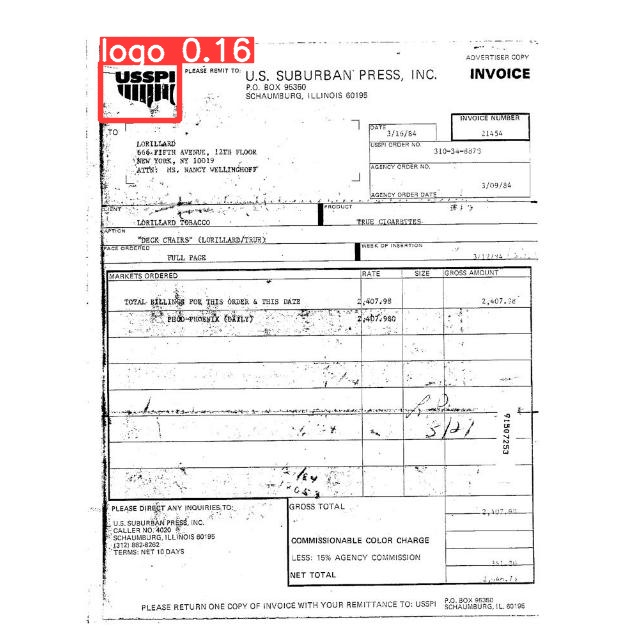

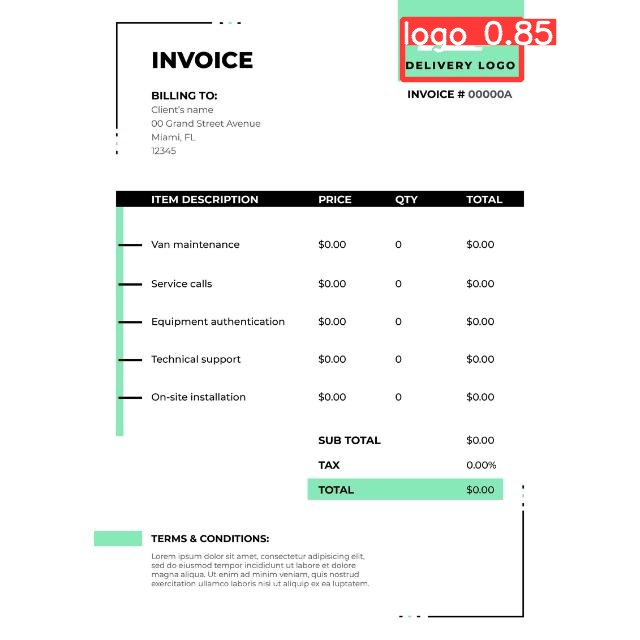

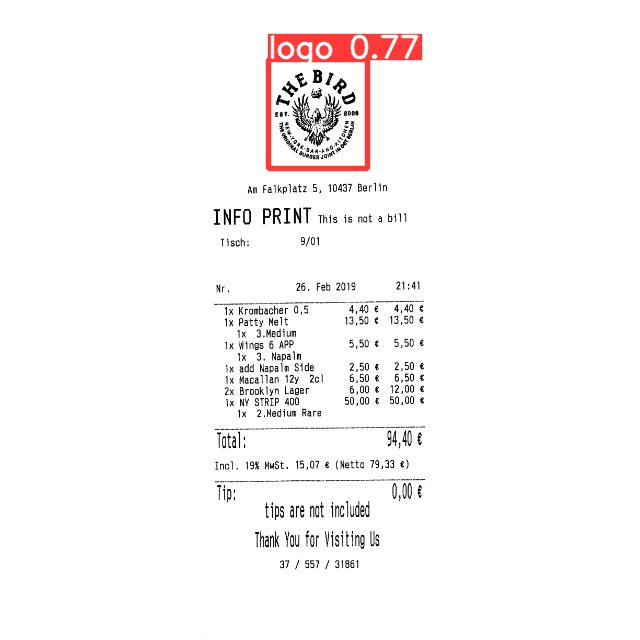

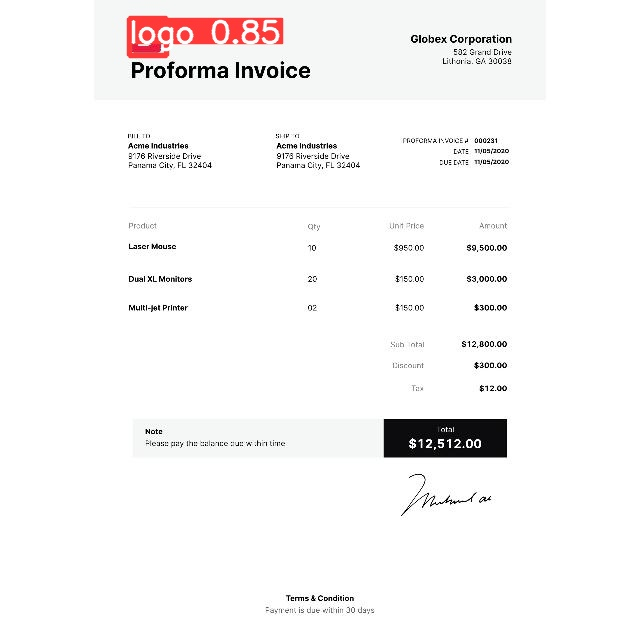

In [30]:
import glob

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg')[:15]: 
    display(Image(filename=imageName))
    print("\n")

In [22]:
dst_dir = '/content/drive/MyDrive/Logo_detection/test_labeled'

In [27]:
!cp -r /content/yolov5/runs/detect/exp/ {dst_dir}/img
!cp /content/yolov5/runs/train/yolov5s_logo_results/weights/best.pt {dst_dir}/best.pt

### Метрики на тестовой выборке:

In [11]:
!python val.py --data /content/yolov5/Logo-Detection-5/data.yaml --task test --weights /content/drive/MyDrive/Logo_detection/test_labeled/best.pt

val: data=/content/yolov5/Logo-Detection-5/data.yaml, weights=['/content/drive/MyDrive/Logo_detection/test_labeled/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.2-247-ga9f895d Python-3.7.15 torch-1.12.1+cu113 CPU

Fusing layers... 
YOLOv5s_logo_detection summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning '/content/yolov5/Logo-Detection-5/test/labels' images and labels...54 found, 0 missing, 0 empty, 0 corrupt: 100% 54/54 [00:00<00:00, 1543.23it/s]
test: New cache created: /content/yolov5/Logo-Detection-5/test/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 2/2 [00:16<00:00,  8.37s/it]
                   all         54         54      0.902

### Еще раз посмотрим на результаты, но на неразмеченных данных

In [20]:
import cv2
import os

In [21]:
desired_size = SIZE
for img_name in os.listdir('/content/drive/MyDrive/unmarked/raw'):
    img_path = os.path.join('/content/drive/MyDrive/unmarked/raw',img_name)
    img = cv2.imread(img_path)
    old_size = img.shape[:2] # old_size is in (height, width) forma
    ratio = float(desired_size)/max(old_size)
    new_size = tuple([int(x*ratio) for x in old_size])
    img = cv2.resize(img, (new_size[1], new_size[0]))
    delta_w = desired_size - new_size[1]
    delta_h = desired_size - new_size[0]
    top, bottom = delta_h//2, delta_h-(delta_h//2)
    left, right = delta_w//2, delta_w-(delta_w//2)
    color = [255, 255, 255]
    new_img = cv2.copyMakeBorder(img, top, bottom, left, right, cv2.BORDER_CONSTANT,
    value=color)
    cv2.imwrite(os.path.join('/content/drive/MyDrive/unmarked/preprocessed',img_name), new_img)


In [28]:
!python detect.py --weights /content/drive/MyDrive/Logo_detection/test_labeled/best.pt --img {SIZE} --conf 0.005 --source /content/drive/MyDrive/unmarked/preprocessed --save-txt --save-conf --max-det 1 --save-crop

detect: weights=['/content/drive/MyDrive/Logo_detection/test_labeled/best.pt'], source=/content/drive/MyDrive/unmarked/preprocessed, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.005, iou_thres=0.45, max_det=1, device=, view_img=False, save_txt=True, save_conf=True, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-247-ga9f895d Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s_logo_detection summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/69 /content/drive/MyDrive/unmarked/preprocessed/108.jpg: 640x640 1 logo, 12.6ms
image 2/69 /content/drive/MyDrive/unmarked/preprocessed/121.jpg: 640x640 1 logo, 12.7ms
image 3/69 /content/drive/MyDrive/unmarked/preprocessed/128.jpg: 640x640 1 logo, 12.6ms
image 4/69 /conte

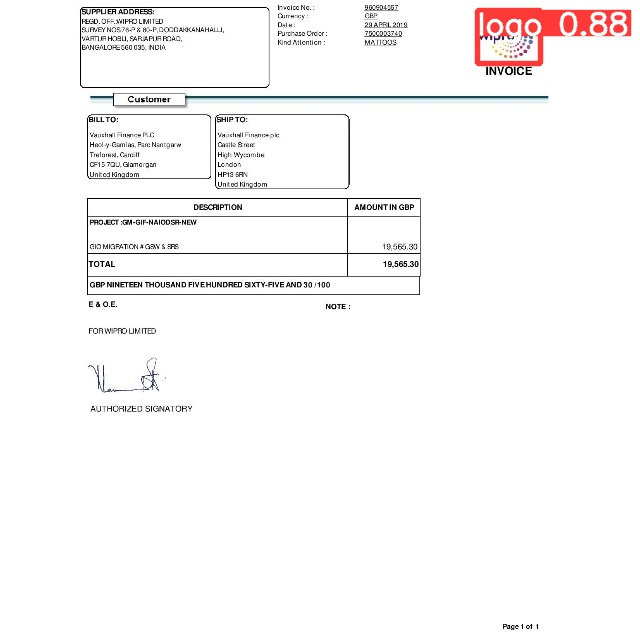

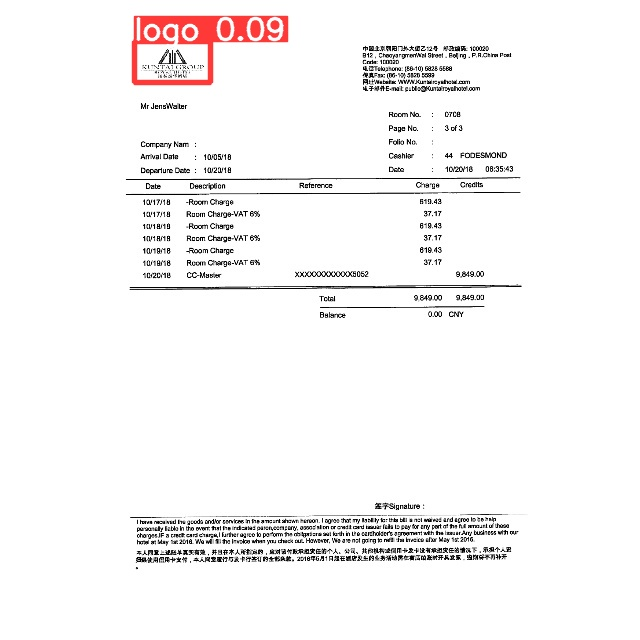

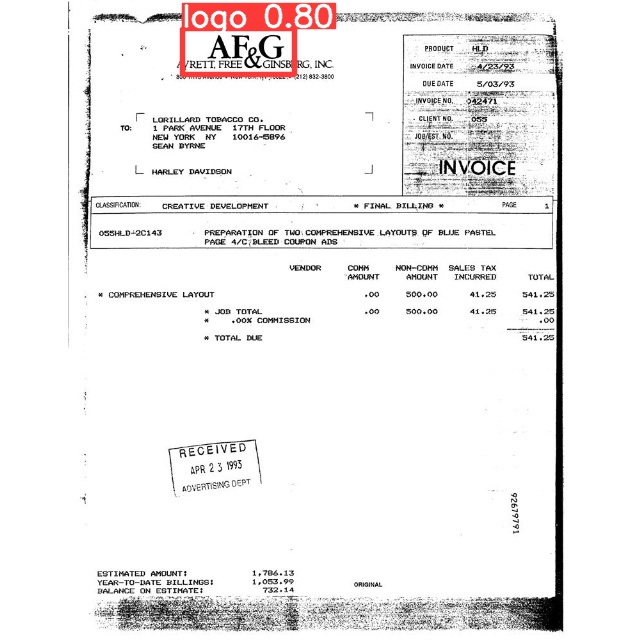

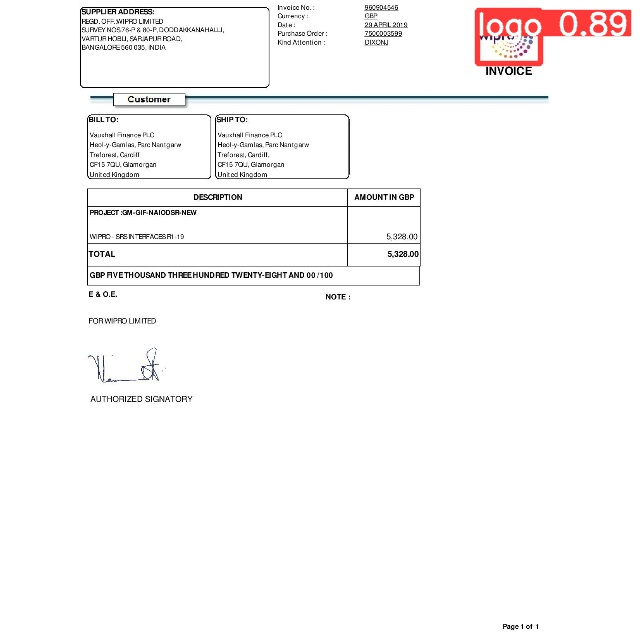

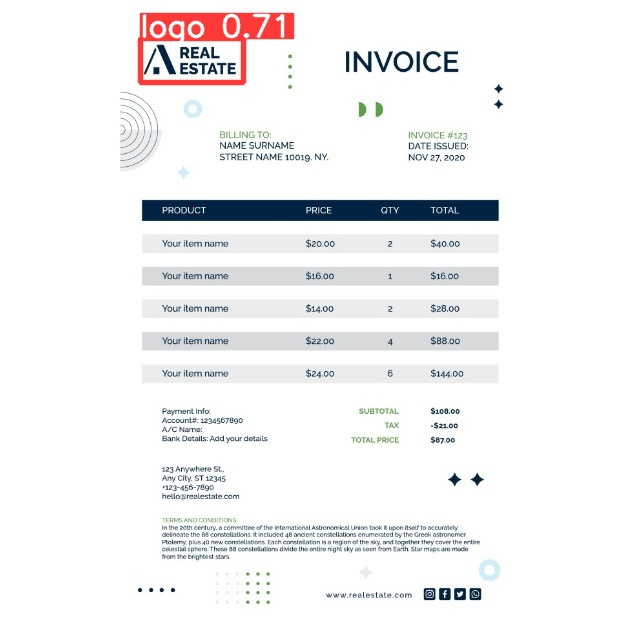

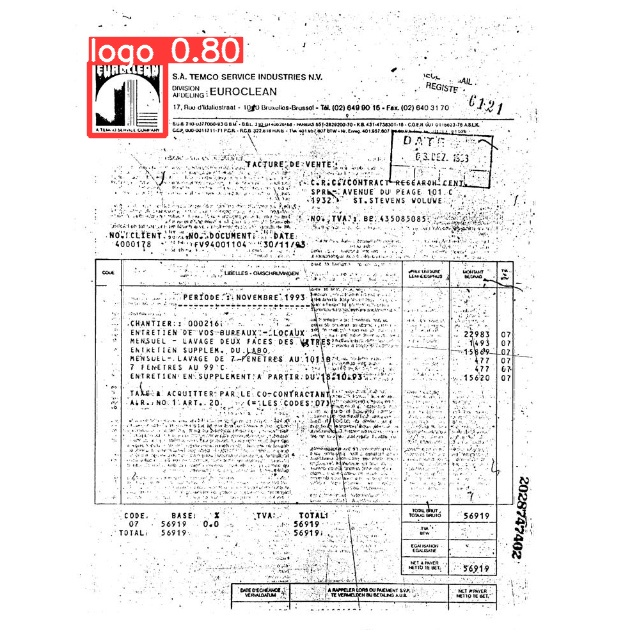

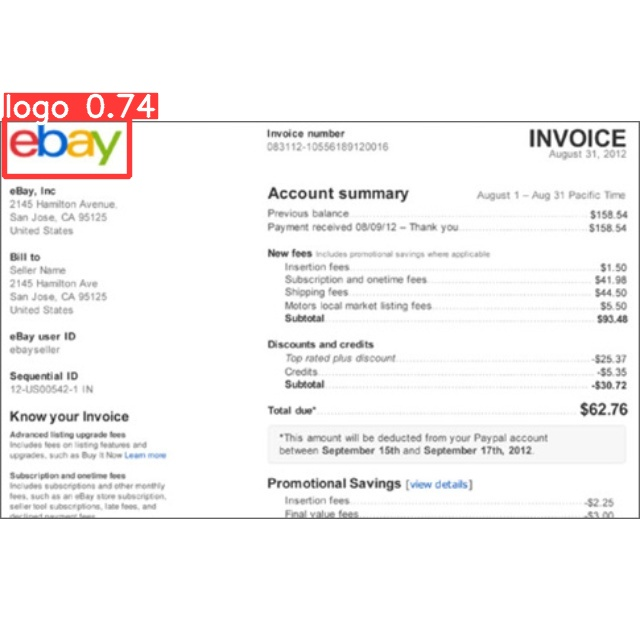

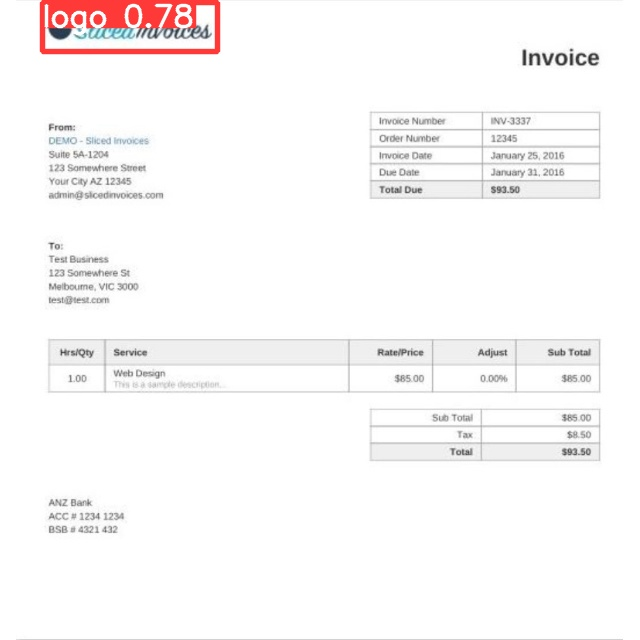

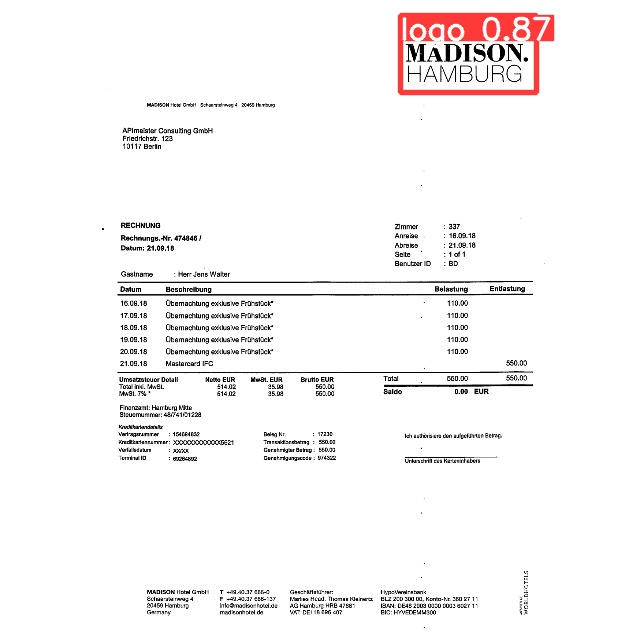

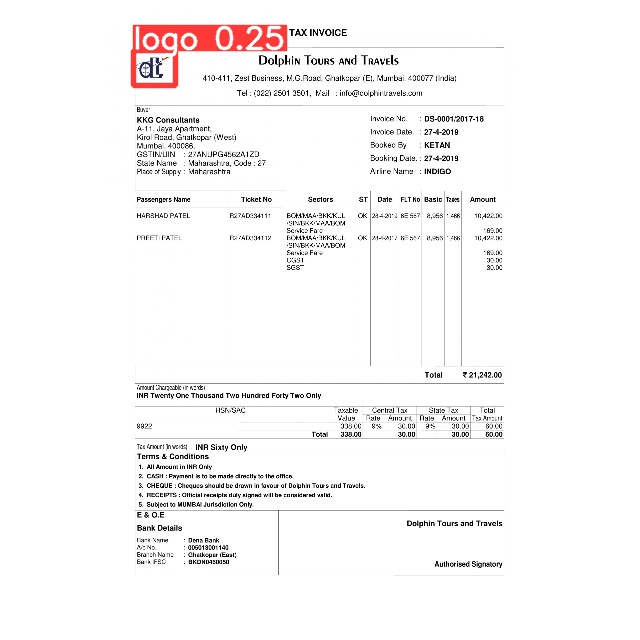

In [29]:
import glob

for imageName in glob.glob('/content/yolov5/runs/detect/exp2/*.jpg')[:10]: 
    display(Image(filename=imageName))
    print("\n")